<a href="https://colab.research.google.com/github/Wachacha-jay/Computer_vision_Image_classification/blob/main/Copy_of_Face_detection_and_recognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

FACE DETECTION AND FACE RECOGNITION PROJECT

In [ ]:
  !pip install facenet-pytorch
  !pip install pytubefix

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 41.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 92.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 102.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 755.6/755.6 MB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 119.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 95.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 61.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 1.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 758.5/758.5 kB 13.9 MB/s eta 0:00:00


In [ ]:
import shutil
import sys
from pathlib import Path
import subprocess
from pathlib import Path

import cv2
import matplotlib.pyplot as plt
import pytubefix
import torch
import torchvision
from IPython.display import Video
from pytubefix import YouTube
from torchvision import transforms
from torchvision.io import read_image
from torchvision.transforms.functional import to_pil_image
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
import PIL
import torch
import torchvision
from facenet_pytorch import MTCNN
from PIL import Image
from torchvision.utils import make_grid

In [ ]:
print("Platform:", sys.platform)
print("Python version:", sys.version)
print("---")
print("torch version : ", torch.__version__)
print("torchvision version : ", torchvision.__version__)
print("PIL version : ", PIL.__version__)
print("pytube version : ", pytubefix.__version__)
print("cv2 version : ", cv2.__version__)

Platform: linux
Python version: 3.11.13 (main, Jun  4 2025, 08:57:29) [GCC 11.4.0]
---
torch version :  2.2.2+cu121
torchvision version :  0.17.2+cu121
PIL version :  10.2.0
pytube version :  9.2.2
cv2 version :  4.11.0


In [ ]:
if torch.cuda.is_available():
    device = "cuda"
else:
    device = "cpu"

print(f"Using {device} device.")

Using cuda device.


In [ ]:
curr_work_dir = Path.cwd()

print(curr_work_dir)

/content


Now lets download a video we will be using, The video is an interview, Mehdi Hasan goes head-to-head with Kimani Ichung’wah, the majority leader of the Kenyan National Assembly, on President Ruto’s rule, the government’s clampdown on dissent and its economic crisis.

In [ ]:
# Replace with the URL of the YouTube video you want to download
youtube_url = "https://www.youtube.com/watch?v=ZSIA7ZB9i00&t=36s"

try:
    yt = YouTube(youtube_url, use_po_token=True)
    # You can choose a specific stream (e.g., highest resolution)
    stream = yt.streams.get_highest_resolution()
    print(f"Downloading: {yt.title}")
    stream.download(output_path=curr_work_dir)
    print("Download complete!")
except Exception as e:
    print(f"An error occurred: {e}")

You can use the tool: https://github.com/YunzheZJU/youtube-po-token-generator, to get the token


KeyboardInterrupt: Interrupted by user

Lets try another way to download the video we will be using

In [ ]:
pip install yt-dlp

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 174.3/174.3 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 74.6 MB/s eta 0:00:00


In [ ]:
# Use yt-dlp to download the video
youtube_url = "https://www.youtube.com/watch?v=ZSIA7ZB9i00&t=36s"
output_path = str(curr_work_dir / "Kenya.mp4.webm")

!yt-dlp -o "{output_path}" "{youtube_url}"

[youtube] Extracting URL: https://www.youtube.com/watch?v=ZSIA7ZB9i00&t=36s
[youtube] ZSIA7ZB9i00: Downloading webpage
[youtube] ZSIA7ZB9i00: Downloading tv client config
[youtube] ZSIA7ZB9i00: Downloading player a10d7fcc-main
[youtube] ZSIA7ZB9i00: Downloading tv player API JSON
[youtube] ZSIA7ZB9i00: Downloading ios player API JSON
[youtube] ZSIA7ZB9i00: Downloading m3u8 information
[info] Testing format 616
[info] ZSIA7ZB9i00: Downloading 1 format(s): 616+251
[hlsnative] Downloading m3u8 manifest
[hlsnative] Total fragments: 579
[download] Destination: /content/Kenya.mp4.f616.mp4
[download] 100% of  540.12MiB in 00:01:05 at 8.20MiB/s
[download] Destination: /content/Kenya.mp4.f251.webm
[download] 100% of   35.81MiB in 00:00:01 at 21.09MiB/s
[Merger] Merging formats into "/content/Kenya.mp4.webm"
Deleting original file /content/Kenya.mp4.f616.mp4 (pass -k to keep)
Deleting original file /content/Kenya.mp4.f251.webm (pass -k to keep)


In [ ]:
video_path = curr_work_dir / "Kenya.mp4.webm"

print(video_path)

/content/Kenya.mp4.webm


In [ ]:
#Lets load the video
video = Video(video_path)
video

This video is long and we will only need  small portion now lets go ahead and truncate the video using ffmpe a command line tool, we will do this by creating a function.

In [ ]:
def cut_video(input_file, start_time, duration, output_file):
    """
    Cuts a portion of the video.

    :parameter input_file: Path to the input video file.
    :parameter output_file: Path to the output video file.
    :parameter start_time: Start time of the cut in seconds or in `HH:MM:SS` format.
    :parameter duration: Duration of the cut in seconds or in `HH:MM:SS` format.
    """
    command = [
        "ffmpeg",
        "-ss",
        str(start_time),
        "-i",
        input_file,
        "-t",
        str(duration),
        "-c",
        "copy",
        output_file,
    ]
    subprocess.run(command)


cut_video?

In [ ]:
#lets create a path to our output video
output_video_name = "output.mp4"

output_video = curr_work_dir / output_video_name

print(output_video)

/content/output.mp4


In [ ]:
#now lets call ou cut video function and we will only use 1 minute of the video.
start_time = "00:02:30"  # Start at 00 seconds
duration = "00:01:00"  # Cut 1 minute

cut_video(video_path, start_time, duration, output_video)

In [ ]:
# Display the video
Video(output_video, width=400)

Let's learn a bit more about our video data. We're curious about things like the frame rate, total frame count, and frame shape. To get this information, we'll use the opencv-python library just like in the previous project (cv2 which we imported at the top of the notebook).

The first step is to create a video capture using cv2.VideoCapture and pass in the path to our video.

In [ ]:
video_capture = cv2.VideoCapture(output_video)
if not video_capture.isOpened():
    print("Error opening video file")
else:
  frame_rate = video_capture.get(cv2.CAP_PROP_FPS)
  frame_count = video_capture.get(cv2.CAP_PROP_FRAME_COUNT)
  frame_width = video_capture.get(cv2.CAP_PROP_FRAME_WIDTH)
  frame_height = video_capture.get(cv2.CAP_PROP_FRAME_HEIGHT)
  print(f"Frame rate: {frame_rate}")
  print(f"Total number of frames: {frame_count}")
  print(f"Frame width: {frame_width}")
  print(f"Frame height: {frame_height}")

Frame rate: 25.0
Total number of frames: 1651.0
Frame width: 1920.0
Frame height: 1080.0


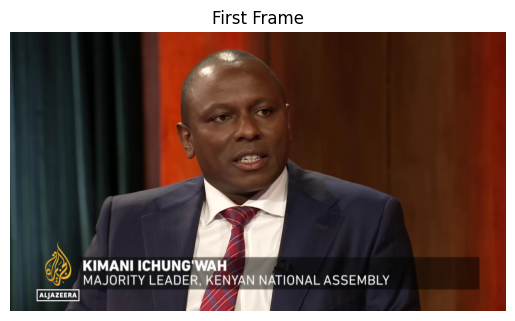

In [ ]:
#Lets see the first frame
ret, first_frame = video_capture.read()

if ret:
    plt.imshow(cv2.cvtColor(first_frame, cv2.COLOR_BGR2RGB))
    plt.title("First Frame")
    plt.axis("off")
    plt.show()
else:
    print("Error: Could not read frame.")

In [ ]:
height, width, channel = first_frame.shape

print("frames height : ", height)
print("frames width : ", width)
print("frames channel : ", channel)

frames height :  1080
frames width :  1920
frames channel :  3


Now tht we have our video and know alittle information about it, now lets get individual frames from the video and first we will create a path for the extracted frames.

In [ ]:
frames_dir = curr_work_dir / "extracted_frames"
frames_dir.mkdir(exist_ok=True)
print(frames_dir)

/content/extracted_frames


We will extract every fifth frame

In [ ]:
interval = frame_rate * 0.2
frame_count = 0
print("Start extracting individual frames...")

# Re-initialize video_capture for the extraction loop
video_capture = cv2.VideoCapture(output_video)

while True:
    # read next frame from the video_capture
    ret, frame = video_capture.read()
    if not ret:
        print("Finished!")
        break  # Break the loop if there are no more frames

    # Save frames at every 'interval' frames
    if frame_count % interval == 0:
        frame_path = frames_dir / f"frame_{frame_count}.jpg"
        cv2.imwrite(frame_path, frame)

    frame_count += 1

# Release the video capture object after the loop
video_capture.release()

Start extracting individual frames...
Finished!


In [ ]:
#Now lets see how many frames we have saved
n_extraced_frames = len(list(frames_dir.iterdir()))

print(f"We saved {n_extraced_frames} frames.")

We saved 300 frames.


Before we start using our face detection model lets display some of the frmes we have extracted

In [ ]:
def display_frames(dir_path, num_frames=5):
    image_list = []
    images = sorted(dir_path.iterdir())
    if images:
        sample_images = images[:num_frames]
        for sample_image in sample_images:
            image = read_image(str(sample_image))

            # Define resizing transformation that resizes to 240 x 240
            resize_transform = transforms.Resize((240,240))
            # Resize image by using `resize_transform`
            image = resize_transform(image)
            image_list.append(image)
    grid = make_grid(image_list, nrow=5)
    image = to_pil_image(grid)
    return image


display_frames?

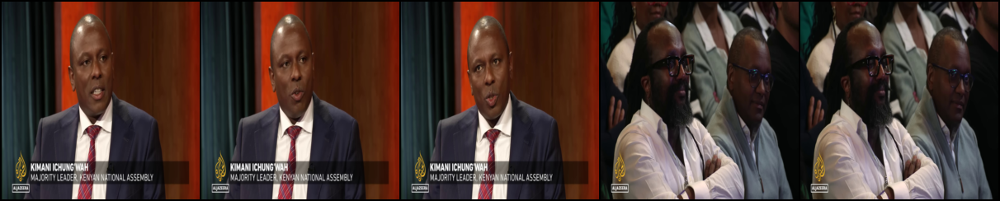

In [ ]:
display_frames(frames_dir)

# INITIALIZING MTCNN MODEL
Now that we have succefully prepared our data We'll perform face detection using a MTCNN network from `facenet_pytorch` library. This model is able to simultaneously propose bounding boxes of faces, determine detection probabilities, and detect facial landmarks like eyes, nose and mouth.

Let's start by initializing the model. Here are a couple of arguments we get to set:
- `device`: The device on which to run the model.
- `keep_all`: A boolean determining if all detected faces are returned or not.
- `min_face_size`: Minimum face size (in pixels) to search for in the image.
- `post_process`: A boolean determining if we want image standardization of detected faces. This is advised before proceeding with face recognition models, but if we want face images that are returned to us to look normal to the human eye, we can set `post_process=False`.

In [ ]:
MTCNN?

In [ ]:
mtcnn = MTCNN(device=device, keep_all=True, min_face_size=60, post_process=False)

print(mtcnn)

MTCNN(
  (pnet): PNet(
    (conv1): Conv2d(3, 10, kernel_size=(3, 3), stride=(1, 1))
    (prelu1): PReLU(num_parameters=10)
    (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
    (conv2): Conv2d(10, 16, kernel_size=(3, 3), stride=(1, 1))
    (prelu2): PReLU(num_parameters=16)
    (conv3): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1))
    (prelu3): PReLU(num_parameters=32)
    (conv4_1): Conv2d(32, 2, kernel_size=(1, 1), stride=(1, 1))
    (softmax4_1): Softmax(dim=1)
    (conv4_2): Conv2d(32, 4, kernel_size=(1, 1), stride=(1, 1))
  )
  (rnet): RNet(
    (conv1): Conv2d(3, 28, kernel_size=(3, 3), stride=(1, 1))
    (prelu1): PReLU(num_parameters=28)
    (pool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
    (conv2): Conv2d(28, 48, kernel_size=(3, 3), stride=(1, 1))
    (prelu2): PReLU(num_parameters=48)
    (pool2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
    (conv3): Conv2d(48, 64,

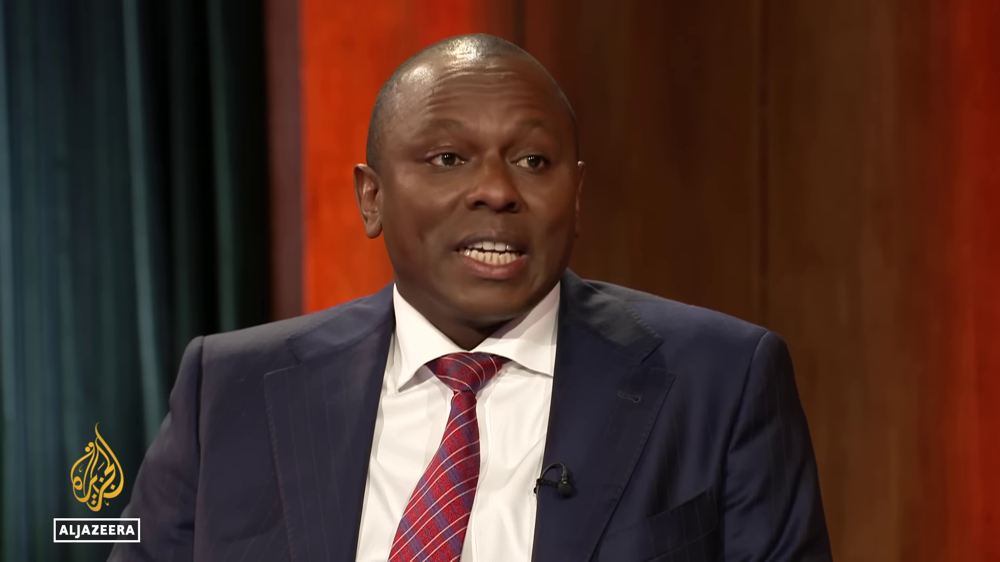

In [ ]:
#Now lets see a sample image we will b e working with
sample_image_filename = "frame_205.jpg"
sample_image_path = frames_dir / sample_image_filename

sample_image = Image.open(sample_image_path)
sample_image

If we want to detect faces and obtain their bounding boxes, we need to use the detect method on the MTCNN model and pass in the sample image. This returns both the bounding boxes of detected faces as well as the predicted probability that the object in a given bounding box is indeed a face.

In [ ]:
boxes, probs = mtcnn.detect(sample_image)
print("boxes type:", type(boxes))
print("probs type:", type(probs))

boxes type: <class 'numpy.ndarray'>
probs type: <class 'numpy.ndarray'>


Array boxes contains the bounding boxes of the detected faces and probs contains the probabilities.

In [ ]:
print(boxes)
print(boxes.shape)

[[737.040283203125 130.5183868408203 1107.4112548828125 599.4378051757812]]
(1, 4)


In [ ]:
number_of_detected_faces = len(boxes)

print(number_of_detected_faces)

1


In [ ]:
num_faces = len(probs[probs > 0.99])

print(num_faces)

1


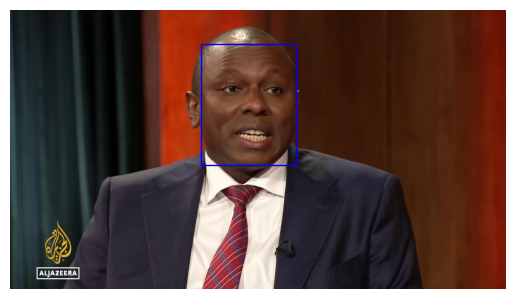

In [ ]:
fig, ax = plt.subplots()
ax.imshow(sample_image)

for box in boxes:
    rect = plt.Rectangle(
        (box[0], box[1]), box[2] - box[0], box[3] - box[1], fill=False, color="blue"
    )
    ax.add_patch(rect)
plt.axis("off");

## Extracting Facial Landmarks
MTCNN not only detects faces but can also mark facial landmarks such as eyes, nose, and mouth in each detected face.

The way to obtain the facial landmarks together with bounding boxes and probabilities is to again use the `detect` method on the MTCNN model. But this time together with the sample image, we need to pass in `landmarks=True`.

In [ ]:
boxes, probs, landmarks  = mtcnn.detect(sample_image, landmarks=True)
print("boxes type:", type(boxes))
print("probs type:", type(probs))
print("landmarks type:", type(landmarks))

boxes type: <class 'numpy.ndarray'>
probs type: <class 'numpy.ndarray'>
landmarks type: <class 'numpy.ndarray'>


The facial landmarks detected by the model on each face are:

- left eye,
- right eye,
- nose,
- left mouth corner,
- right mouth corner

Let's make sure that the shape of the landmarks array matches what we'd expect given that six faces were detected.
Lets print the shape of the landmarks array returned by the model.

In [ ]:
print(landmarks.shape)

(1, 5, 2)


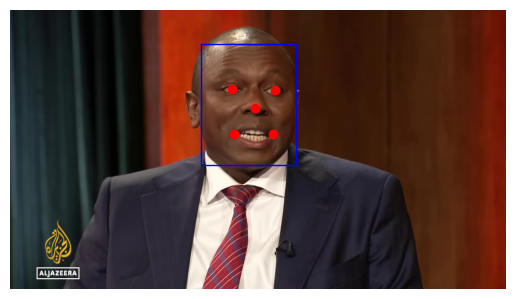

In [ ]:
#lets plot the bounding boxews and the landmarks
fig, ax = plt.subplots()
ax.imshow(sample_image)

for box, landmark in zip(boxes,landmarks):
    rect = plt.Rectangle(
        (box[0], box[1]), box[2] - box[0], box[3] - box[1], fill=False, color="blue"
    )
    ax.add_patch(rect)
    for point in landmark:
        ax.plot(point[0], point[1], marker="o", color="red")
plt.axis("off");

In [ ]:
!pip install yt-dlp

We will want to further face analysis like for example perform face recognition, it's a good idea to crop out the detected faces. That way further analysis can focus only on the relevant parts of the image.

So let's learn how we can crop out the detected faces!

In order to get the PyTorch tensors of the detected faces instead of the bounding boxes, we need to call the MTCNN object directly and just pass in the image we're working with.

In [ ]:
faces = mtcnn(sample_image)

print(faces.shape)

torch.Size([1, 3, 160, 160])


In [ ]:
Grid = make_grid(faces, nrow=1)

print(Grid.shape)

torch.Size([3, 160, 160])


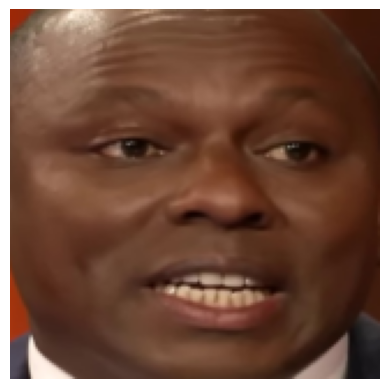

In [ ]:
plt.imshow(Grid.permute(1, 2, 0).int())
plt.axis("off");

To continue with our task we will need to create a subset of our dta so as to create embeddings for the faces so as we will be able to perform facial recognition or faceprint.

In [ ]:
#now we will crete two directories for the two people in the video i know
kimani_dir = curr_work_dir / "kimani"
kimani_dir.mkdir(exist_ok=True)

mehdi_dir = curr_work_dir / "mehdi"
mehdi_dir.mkdir(exist_ok=True)

In [ ]:
kimani_img = [
    "frame_10.jpg",
    "frame_105.jpg",
    "frame_1285.jpg",
    "frame_215.jpg",
    "frame_205.jpg"
]

mehdi_img = [
    "frame_1015.jpg",
    "frame_865.jpg",
    "frame_1055.jpg",
    "frame_1125.jpg",
    "frame_1485.jpg"
]

In [ ]:
#lets create paths to the images
kimani_img_paths = [frames_dir / img for img in kimani_img]
mehdi_img_paths = [frames_dir / img for img in mehdi_img]

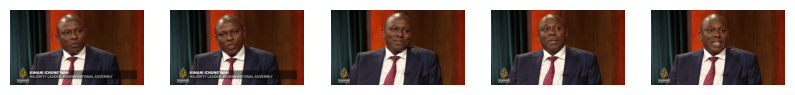

In [ ]:
#Befor we copy the images to the directories lets evaluate them
fig, axs = plt.subplots(1, 5, figsize=(10, 8))

for i, ax in enumerate(axs):
    ax.imshow(Image.open(kimani_img_paths[i]))
    ax.axis("off")

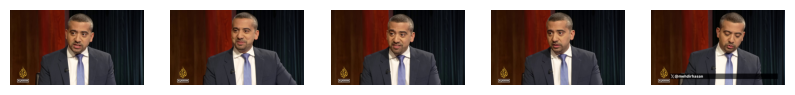

In [ ]:
fig, axs = plt.subplots(1, 5, figsize=(10, 8))

for i, ax in enumerate(axs):
    ax.imshow(Image.open(mehdi_img_paths[i]))
    ax.axis("off")

Now our images are oky lets copy them to their respective directories

In [ ]:
for img_path in kimani_img_paths:
    shutil.copy(img_path, kimani_dir)

for img_path in mehdi_img_paths:
    shutil.copy(img_path, mehdi_dir)

Now we are ready for our next task for our facial recognition we will first create embeddings for the faces then we will use inception Resnet.

In [ ]:
import sys
from pathlib import Path
from facenet_pytorch import InceptionResnetV1
from PIL import Image
from torch.utils.data import DataLoader
from torchvision import datasets

Now lets prepare our data

In [ ]:
images_dir = curr_work_dir / "images"
images_dir.mkdir(exist_ok=True)

shutil.move(str(kimani_dir), str(images_dir))
shutil.move(str(mehdi_dir), str(images_dir))

print(f"Moved '{kimani_dir.name}' and '{mehdi_dir.name}' into '{images_dir.name}'")

Moved 'kimani' and 'mehdi' into 'images'


In [ ]:
#Lets create a dataset object
dataset = datasets.ImageFolder(images_dir)
dataset

Dataset ImageFolder
    Number of datapoints: 10
    Root location: /content/images

By creating dataset object we now have 2 classes

In [ ]:
for subdirectory in images_dir.iterdir():
    print(subdirectory)

/content/images/kimani
/content/images/mehdi


In [ ]:
#dataset object has an attribute class_to_idx
dataset.class_to_idx

{'kimani': 0, 'mehdi': 1}

In [ ]:
#now let reverse the mapping
class_idx_to_name = {idx: name for name, idx in dataset.class_to_idx.items()}
class_idx_to_name

{0: 'kimani', 1: 'mehdi'}

In [ ]:
# Now lets create a dataloader and instead of batchsize will use collate function
def collate_fn(x):
    return x[0]
dataloader = DataLoader(dataset, collate_fn=collate_fn)

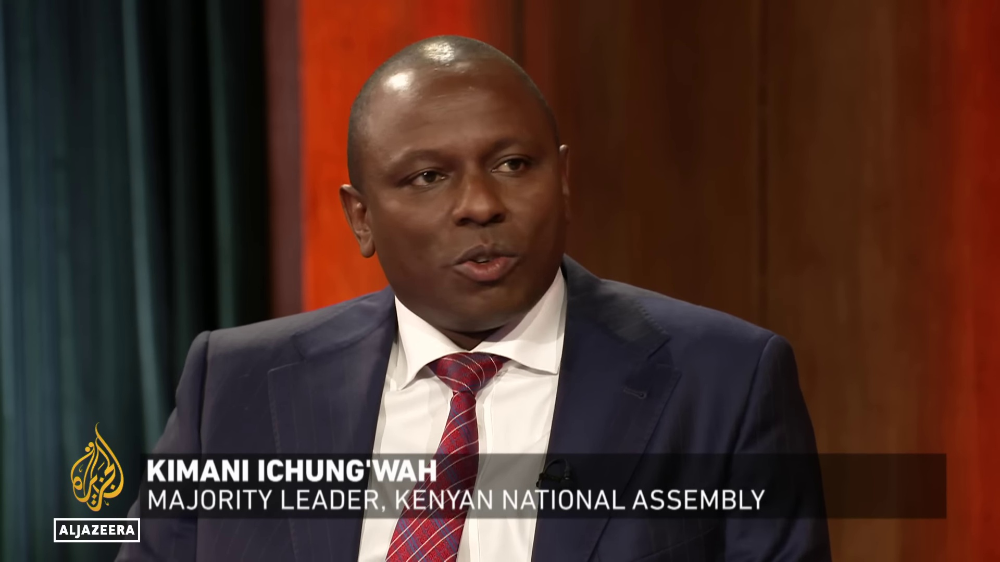

In [ ]:
img, _ = next(iter(dataloader))
img

In [ ]:
#lets create our mtcnn model to detect and get the croped faces
mtcnn0 = MTCNN(image_size=240, keep_all=False, min_face_size=40)
print(mtcnn0)

MTCNN(
  (pnet): PNet(
    (conv1): Conv2d(3, 10, kernel_size=(3, 3), stride=(1, 1))
    (prelu1): PReLU(num_parameters=10)
    (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
    (conv2): Conv2d(10, 16, kernel_size=(3, 3), stride=(1, 1))
    (prelu2): PReLU(num_parameters=16)
    (conv3): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1))
    (prelu3): PReLU(num_parameters=32)
    (conv4_1): Conv2d(32, 2, kernel_size=(1, 1), stride=(1, 1))
    (softmax4_1): Softmax(dim=1)
    (conv4_2): Conv2d(32, 4, kernel_size=(1, 1), stride=(1, 1))
  )
  (rnet): RNet(
    (conv1): Conv2d(3, 28, kernel_size=(3, 3), stride=(1, 1))
    (prelu1): PReLU(num_parameters=28)
    (pool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
    (conv2): Conv2d(28, 48, kernel_size=(3, 3), stride=(1, 1))
    (prelu2): PReLU(num_parameters=48)
    (pool2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
    (conv3): Conv2d(48, 64,

We'll also initialize the Inception-ResNet V1 model. This model is used for facial recognition. Particularly, we'll be using a model that has been pre-trained on the VGGFace2 dataset. This is a massive dataset of over 3 million images and over 9000 identities.

In [ ]:
resnet = InceptionResnetV1(pretrained="vggface2").eval()
print(resnet)

  0%|          | 0.00/107M [00:00<?, ?B/s]

InceptionResnetV1(
  (conv2d_1a): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (conv2d_2a): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (conv2d_2b): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (maxpool_3a): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2d_3b): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (conv2d_4a): 

In [ ]:
#lets pass our img to mtcnn to get the face and probability
face, prob = mtcnn0(img, return_prob=True)
prob

0.9998513460159302

In [ ]:
#lets try passing it in our resnet
try:
  resnet(face)
except ValueError as e:
  print(e)


expected 4D input (got 3D input)


our model expects a 4d tensor and we have a 3d tensor

In [ ]:
print(face.shape)

torch.Size([3, 240, 240])


Lets mke it a 4d tensor

In [ ]:
face4d = face.unsqueeze(0)
print(face.shape)

torch.Size([3, 240, 240])


In [ ]:
#Now lets pass it through the resnet
embeddings = resnet(face4d)
print(f"Shape of face embedding: {embeddings.shape}")

Shape of face embedding: torch.Size([1, 512])


The model returns an embedding for the face using 512 dimensions. The embedding is a vector that represents the features the model extracted. Now we are ready to run our model on all the extracted frames. The process will be:

Iterate over all images
Run the face detection model
If the model returns a result and with a probability of at least 90%, add the embeddings to a dictionary that keeps the embeddings for each person separately.

In [ ]:
# Dictionary that maps name to list of their embeddings
name_to_embeddings = {name: [] for name in class_idx_to_name.values()}

for img, idx in dataloader:
    face, prob = mtcnn0(img, return_prob=True)
    if face is not None and prob > 0.99:
        emb = resnet(face.unsqueeze(0))
        name_to_embeddings[class_idx_to_name[idx]].append(emb)

We have a number of face imbeddings for both kimani and medhi lets find and avarage for the embeddings.

In [ ]:
print(name_to_embeddings.keys())
print(type(name_to_embeddings["kimani"]))

dict_keys(['kimani', 'mehdi'])
<class 'list'>


In [ ]:
embeddings_kimani = torch.stack(name_to_embeddings["kimani"])
embeddings_medhi = torch.stack(name_to_embeddings["kimani"])
print(embeddings_kimani.shape)
print(embeddings_medhi.shape)

torch.Size([5, 1, 512])
torch.Size([5, 1, 512])


Now lets find the average emeddings for stacks, we will find the men on the 0 dimension.

In [ ]:
avg_embeddings_kimani = torch.mean(embeddings_kimani, dim = 0)
avg_embeddings_medhi = torch.mean(embeddings_medhi, dim = 0)
print(avg_embeddings_kimani.shape)
print(avg_embeddings_medhi.shape)

torch.Size([1, 512])
torch.Size([1, 512])


In [ ]:
embeddings_to_save = [(avg_embeddings_kimani, "kimani"), (avg_embeddings_medhi, "medhi")]

torch.save(embeddings_to_save, "embeddings.pt")

Now lets the face embeddings

In [ ]:
embedding_data = torch.load(Path("embeddings.pt"))

names = [name for _, name in embedding_data]
print(f"Loaded the embedding for: {names}")

Loaded the embedding for: ['kimani', 'medhi']


We can consider the embeddings of kimani and medhi as our database of known faces. If we now take a new image, we can check if we can recognize whether kimani or medhi appear in that image! We'll first focus on one image with only kimani.

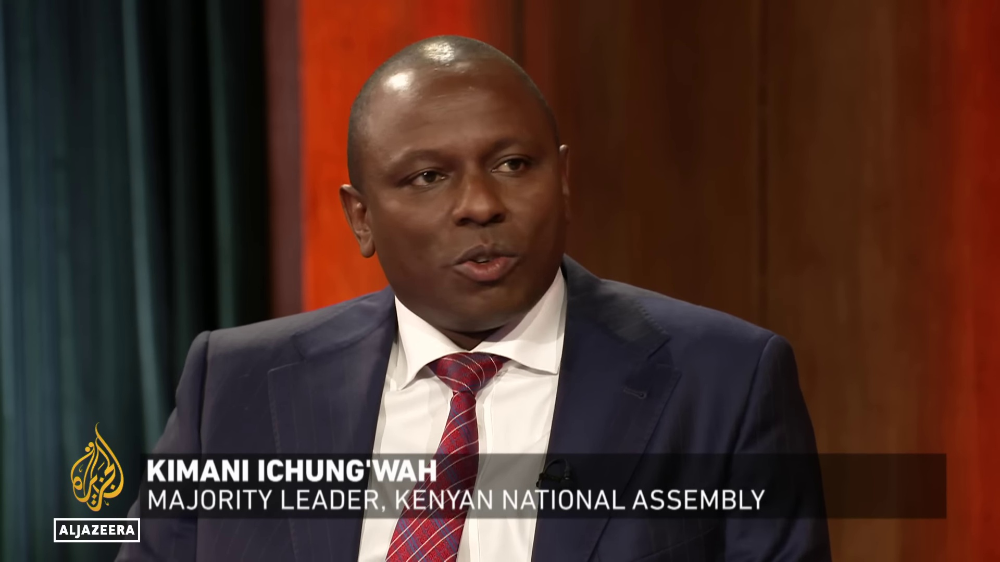

In [ ]:
sample_test_image_path = curr_work_dir / "extracted_frames" / "frame_10.jpg"
test_image = Image.open(sample_test_image_path)
test_image

In [ ]:
#Now lets instantiate a model that can be able to detect many faces
mtcnn1 = MTCNN(image_size=240, keep_all=True, min_face_size=40)
print(f"MTCNN image size: {mtcnn.image_size}")
print(f"MTCNN keeping all faces: {mtcnn.keep_all}")

MTCNN image size: 160
MTCNN keeping all faces: True


In [ ]:
img_cropped_list, prob_list = mtcnn1(test_image, return_prob = True)

print(f"Number of detected faces: {len(prob_list)}")
print(f"Probability of detected face: {prob_list[0]}")

Number of detected faces: 1
Probability of detected face: 0.9998513460159302


In [ ]:
#Lets get the face embedding of the cropped images from the test_image
for i, prob in enumerate(prob_list):
    if prob > 0.90:
        emb = resnet(img_cropped_list[i].unsqueeze(0))

With the embedding now we can be able to see how close it is to kimani's average embedding nd for this we will use torch dist function to get the distance

In [ ]:
distances = {}

for known_emb, name in embedding_data:
    dist = torch.dist(known_emb, emb)
    distances[name] = dist

closest, min_dist = min(distances.items(), key=lambda x: x[1])
print(f"Closest match: {closest}")
print(f"Calculated distance: {min_dist :.2f}")

Closest match: kimani
Calculated distance: 0.29


In [ ]:
#Now lets detect the bounding boxes
boxes, _ = mtcnn.detect(test_image)
print(f"Shape of boxes tensor: {boxes.shape}")

Shape of boxes tensor: (1, 4)


We will use a threashhold of 0.8 any distance more than this will be unrecognized, while any distance less than threshhold will be given the closest name.

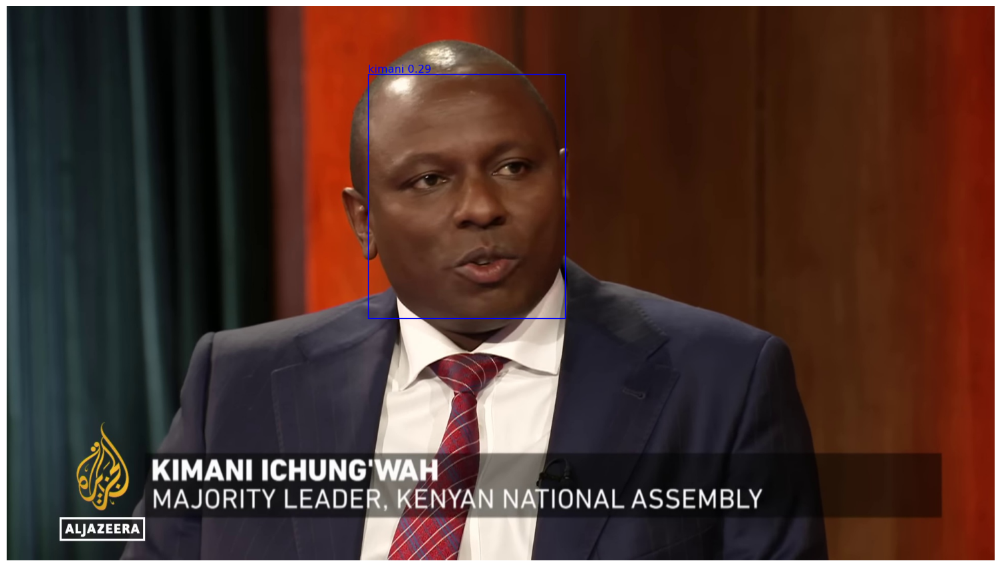

In [ ]:
threshold = 0.8
# This sets the image size and draws the original image
width, height = test_image.size
dpi = 96
fig = plt.figure(figsize=(width / dpi, height / dpi), dpi=dpi)
axis = fig.subplots()
axis.imshow(test_image)
plt.axis("off")

for box in boxes:
    rect = plt.Rectangle(
        (box[0], box[1]), box[2] - box[0], box[3] - box[1], fill=False, color="blue"
    )
    axis.add_patch(rect)

    closest, min_dist = min(distances.items(), key=lambda x: x[1])

    # Drawing the box with recognition results

    if min_dist < threshold:
        name = closest
        color = "blue"
    else:
        name = "Unrecognized"
        color = "red"

    plt.text(
        box[0],
        box[1],
        f"{name} {min_dist:.2f}",
        fontsize=12,
        color=color,
        ha="left",
        va="bottom",
    )

plt.axis("off")
plt.show()

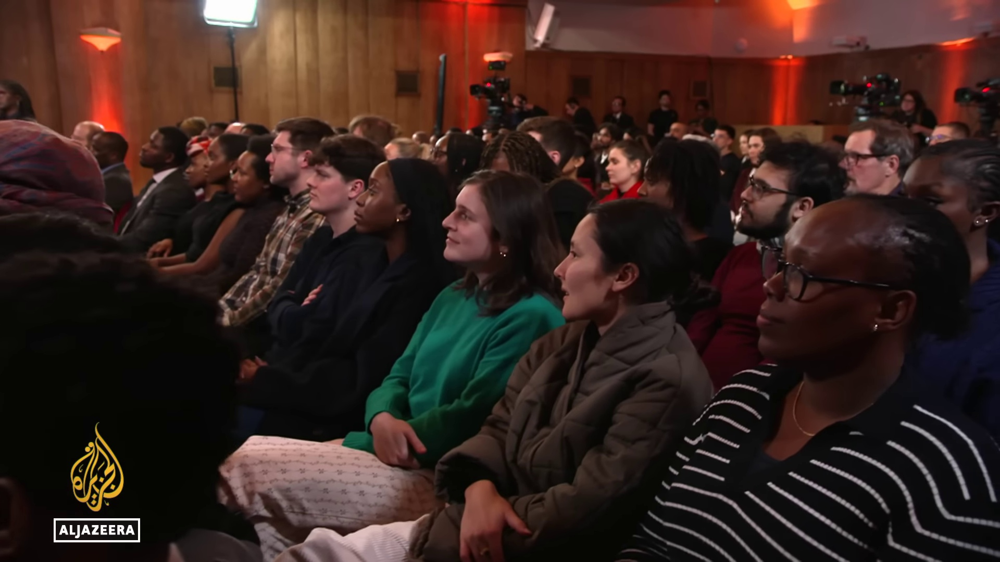

In [ ]:
#Now lets use an imgage with multiple faces
img_mutiple_people_path = curr_work_dir / "extracted_frames" / "frame_255.jpg"
test_multiple_img = Image.open(img_mutiple_people_path)
test_multiple_img

In [ ]:
#Lets create a function to detect, crete embeddings and check for distance
def recognize_faces(img_path, embedding_data, mtcnn, resnet, threshold=0.7):
    # Generating the bounding boxes, faces tensors, and probabilities
    image = Image.open(img_path)
    boxes, probs = mtcnn.detect(image)
    cropped_images = mtcnn(image)

    if boxes is None:
        return

    # This sets the image size and draws the original image
    width, height = image.size
    dpi = 96
    fig = plt.figure(figsize=(width / dpi, height / dpi), dpi=dpi)
    axis = fig.subplots()
    axis.imshow(image)
    plt.axis("off")

    # Iterating over each face and comparing it against the pre-calculated embeddings
    # from our "database"
    for box, prob, face in zip(boxes, probs, cropped_images):
        if prob < 0.90:
            continue

        # Draw bounding boxes for all detected faces
        rect = plt.Rectangle(
            (box[0], box[1]),
            box[2] - box[0],
            box[3] - box[1],
            fill=False,
            color="blue",
        )
        axis.add_patch(rect)

        # Find the closest face from our database of faces
        emb = resnet(face.unsqueeze(0))
        distances = {}
        for known_emb, name in embedding_data:
            dist = torch.dist(emb, known_emb).item()
            distances[name] = dist

        closest, min_dist = min(distances.items(), key=lambda x: x[1])

        # Drawing the box with recognition results
        name = closest if min_dist < threshold else "Unrecognized"
        color = "red" if name == "Unrecognized" else "blue"
        label = f"{name} {min_dist:.2f}"

        axis.text(box[0], box[1], label, fontsize=8, color=color)

    plt.axis("off")
    plt.show()

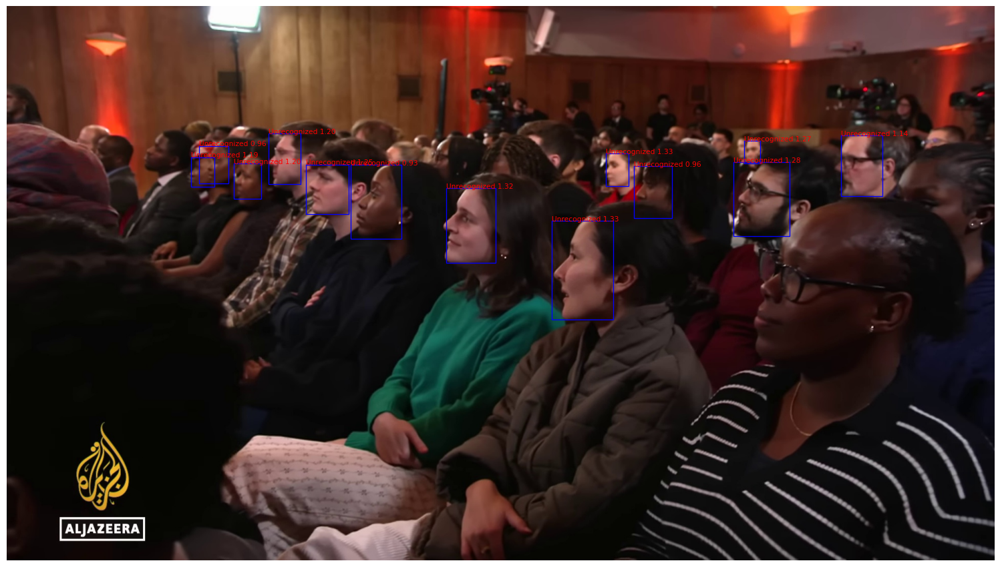

In [ ]:
recognize_faces(img_mutiple_people_path,embedding_data, mtcnn1, resnet)

## Conclusion

In this notebook, we successfully built a basic face detection and recognition system. We started by downloading a YouTube video and extracting frames from it. We then used the MTCNN model from the `facenet-pytorch` library to detect faces and extract facial landmarks from the frames.

Next, we prepared a small dataset of images for two individuals (Kimani and Mehdi) and used the Inception-ResNet V1 model, pre-trained on the VGGFace2 dataset, to generate face embeddings for these individuals. We calculated the average embedding for each person to create a "database" of known faces.

Finally, we demonstrated how to use these embeddings to recognize faces in new images. By comparing the embedding of a detected face in a new image to the average embeddings in our database, we were able to identify whether the face belonged to Kimani or Mehdi, or if it was an unrecognized face, based on a defined threshold. This showcases a fundamental approach to building a face recognition system using deep learning models.